<a href="https://colab.research.google.com/github/ns-m/data_analysis/blob/main/Copy_of_AutoGluon%2BEDA_income.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#для проверки включения GPU (среда выполнения -> сменить среду выполнения -> аппартаный ускоритель GPU)
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
Found GPU at: /device:GPU:0


In [ ]:
import pandas as pd
train_data = pd.read_csv('https://autogluon.s3.amazonaws.com/datasets/Inc/train.csv')
subsample_size = 39073  # subsample subset of data for faster demo, try setting this to much larger values
train_data = train_data.sample(n=subsample_size, random_state=0)
train_data.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,class
6118,51,Private,39264,Some-college,10,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,>50K
23204,58,Private,51662,10th,6,Married-civ-spouse,Other-service,Wife,White,Female,0,0,8,United-States,<=50K
29590,40,Private,326310,Some-college,10,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,44,United-States,<=50K
18116,37,Private,222450,HS-grad,9,Never-married,Sales,Not-in-family,White,Male,0,2339,40,El-Salvador,<=50K
33964,62,Private,109190,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,15024,0,40,United-States,>50K


In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39073 entries, 6118 to 2732
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             39073 non-null  int64 
 1   workclass       39073 non-null  object
 2   fnlwgt          39073 non-null  int64 
 3   education       39073 non-null  object
 4   education-num   39073 non-null  int64 
 5   marital-status  39073 non-null  object
 6   occupation      39073 non-null  object
 7   relationship    39073 non-null  object
 8   race            39073 non-null  object
 9   sex             39073 non-null  object
 10  capital-gain    39073 non-null  int64 
 11  capital-loss    39073 non-null  int64 
 12  hours-per-week  39073 non-null  int64 
 13  native-country  39073 non-null  object
 14  class           39073 non-null  object
dtypes: int64(6), object(9)
memory usage: 4.8+ MB


In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip # перезапустить среду и выполнить еще раз

In [ ]:
from pandas_profiling import ProfileReport
profile=ProfileReport(train_data, title="train_data", html={'style':{'full_width': True}})

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file(output_file="train_data.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# **dataprep**

In [ ]:
!pip install dataprep

In [ ]:
from dataprep.eda import *


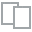
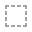
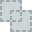
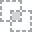
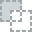
...
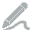
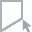
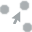
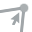
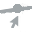

In [ ]:
plot(train_data)


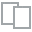
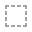
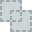
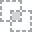
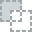
...
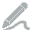
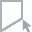
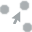
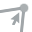
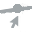

In [ ]:
plot(train_data, 'native-country', 'class')


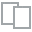
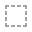
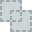
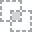
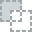
...
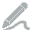
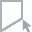
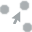
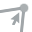
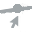

In [ ]:
plot(train_data, 'sex', 'class')


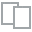
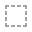
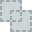
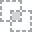
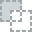
...
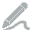
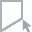
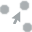
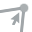
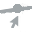

In [ ]:
plot(train_data, 'capital-gain', 'class')


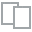
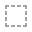
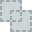
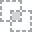
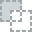
...
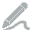
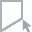
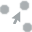
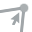
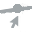

In [ ]:
plot(train_data, 'workclass', 'class')


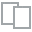
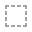
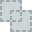
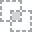
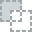
...
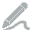
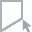
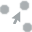
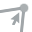
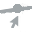

In [ ]:
plot(train_data, 'age', 'class')


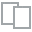
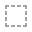
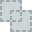
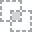
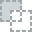
...
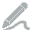
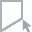
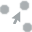
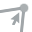
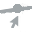

In [ ]:
plot(train_data, 'education', 'class')


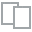
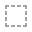
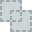
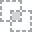
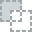
...
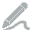
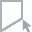
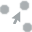
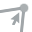
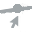

In [ ]:
plot(train_data, 'race', 'class')

DataPrep Report
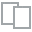
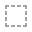
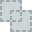
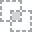
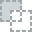
...
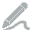
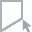
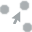
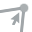
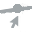

In [ ]:
from dataprep.eda import create_report
#df = load_dataset("train_data")
create_report(train_data)

# ***dtale***

In [ ]:
!pip install dtale

In [ ]:
import dtale
#import dtale.app as dtale_app

#dtale_app.USE_NGROK = True
#dtale.show(train_data)

In [ ]:
d = dtale.show(train_data)
d

2022-01-13 13:20:00,913 - INFO     - NumExpr defaulting to 2 threads.


http://fe429bfde635:40000/dtale/main/1

# Installing AutoGluon

Первое, что мы делаем, это устанавливаем AutoGluon с поддержкой pip. Дополнительные инструкции по установке см. В Руководстве по установке AutoGluon здесь (https://auto.gluon.ai/stable/index.html).

In [ ]:
#!pip install --upgrade pip
#!pip install --upgrade setuptools
#!pip install --upgrade "mxnet<2.0.0"
#!pip install --pre autogluon

In [ ]:
! pip install mxnet autogluon
# перезапустить среду и выполнить еще раз

In [ ]:
from autogluon.tabular import TabularDataset, TabularPredictor

In [ ]:
label = 'class'
print("Summary of class variable: \n", train_data[label].describe())

Summary of class variable: 
 count      39073
unique         2
top        <=50K
freq       29704
Name: class, dtype: object


In [ ]:
save_path = 'agModels-predictClass'  # specifies folder to store trained models
predictor = TabularPredictor(label=label, path=save_path).fit(train_data)

INFO:autogluon.tabular.learner.default_learner:Beginning AutoGluon training ...
INFO:autogluon.tabular.learner.default_learner:AutoGluon will save models to "agModels-predictClass/"
INFO:autogluon.tabular.learner.default_learner:AutoGluon Version:  0.5.2
INFO:autogluon.tabular.learner.default_learner:Python Version:     3.7.14
INFO:autogluon.tabular.learner.default_learner:Operating System:   Linux
INFO:autogluon.tabular.learner.default_learner:Train Data Rows:    39073
INFO:autogluon.tabular.learner.default_learner:Train Data Columns: 14
INFO:autogluon.tabular.learner.default_learner:Label Column: class
INFO:autogluon.tabular.learner.default_learner:Preprocessing data ...
Level 25:autogluon.core.utils.utils:AutoGluon infers your prediction problem is: 'binary' (because only two unique label-values observed).
INFO:autogluon.core.utils.utils:	2 unique label values:  [' >50K', ' <=50K']
Level 25:autogluon.core.utils.utils:	If 'binary' is not the correct problem_type, please manually spec

In [ ]:
test_data = TabularDataset('https://autogluon.s3.amazonaws.com/datasets/Inc/test.csv')
y_test = test_data[label]  # values to predict
test_data_nolab = test_data.drop(columns=[label])  # delete label column to prove we're not cheating
test_data_nolab.head()

INFO:autogluon.common.loaders.load_pd:Loaded data from: https://autogluon.s3.amazonaws.com/datasets/Inc/test.csv | Columns = 15 / 15 | Rows = 9769 -> 9769


,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
0,31,Private,169085,11th,7,Married-civ-spouse,Sales,Wife,White,Female,0,0,20,United-States
1,17,Self-emp-not-inc,226203,12th,8,Never-married,Sales,Own-child,White,Male,0,0,45,United-States
2,47,Private,54260,Assoc-voc,11,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,1887,60,United-States
3,21,Private,176262,Some-college,10,Never-married,Exec-managerial,Own-child,White,Female,0,0,30,United-States
4,17,Private,241185,12th,8,Never-married,Prof-specialty,Own-child,White,Male,0,0,20,United-States


In [ ]:
predictor = TabularPredictor.load(save_path)  # unnecessary, just demonstrates how to load previously-trained predictor from file

y_pred = predictor.predict(test_data_nolab)
print("Predictions:  \n", y_pred)
perf = predictor.evaluate_predictions(y_true=y_test, y_pred=y_pred, auxiliary_metrics=True)

INFO:autogluon.tabular.learner.abstract_learner:Evaluation: accuracy on test data: 0.8742962432183438
INFO:autogluon.tabular.learner.abstract_learner:Evaluations on test data:
INFO:autogluon.tabular.learner.abstract_learner:{
    "accuracy": 0.8742962432183438,
    "balanced_accuracy": 0.7985678709182998,
    "mcc": 0.6362777856158593,
    "f1": 0.7118723603941812,
    "precision": 0.7803497942386831,
    "recall": 0.6544434857635893
}


Predictions:  
 0        <=50K
1        <=50K
2         >50K
3        <=50K
4        <=50K
         ...  
9764     <=50K
9765     <=50K
9766     <=50K
9767     <=50K
9768     <=50K
Name: class, Length: 9769, dtype: object


In [ ]:
predictor.leaderboard(test_data)

                  model  score_test  score_val  pred_time_test  pred_time_val   fit_time  pred_time_test_marginal  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0              CatBoost    0.874910     0.8784        0.033552       0.018493  34.223737                 0.033552                0.018493          34.223737            1       True          7
1   WeightedEnsemble_L2    0.874296     0.8864        0.273140       0.085688  56.914913                 0.007795                0.004217           1.252783            2       True         14
2              LightGBM    0.873887     0.8820        0.076419       0.029462   1.128407                 0.076419                0.029462           1.128407            1       True          4
3            LightGBMXT    0.873068     0.8780        0.292031       0.084606   3.553547                 0.292031                0.084606           3.553547            1       True          3
4         LightGBMLarge    0.872658     

,model,score_test,score_val,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,CatBoost,0.874910,0.8784,0.033552,0.018493,34.223737,0.033552,0.018493,34.223737,1,True,7
1,WeightedEnsemble_L2,0.874296,0.8864,0.273140,0.085688,56.914913,0.007795,0.004217,1.252783,2,True,14
2,LightGBM,0.873887,0.8820,0.076419,0.029462,1.128407,0.076419,0.029462,1.128407,1,True,4
3,LightGBMXT,0.873068,0.8780,0.292031,0.084606,3.553547,0.292031,0.084606,3.553547,1,True,3
4,LightGBMLarge,0.872658,0.8792,0.115690,0.034882,1.734783,0.115690,0.034882,1.734783,1,True,13
5,XGBoost,0.871532,0.8844,0.113296,0.032574,2.839097,0.113296,0.032574,2.839097,1,True,11
6,RandomForestEntr,0.860784,0.8600,0.700160,0.310030,10.134215,0.700160,0.310030,10.134215,1,True,6
7,RandomForestGini,0.860375,0.8648,0.698770,0.209782,9.687856,0.698770,0.209782,9.687856,1,True,5
8,NeuralNetFastAI,0.857304,0.8648,0.160063,0.056516,42.331026,0.160063,0.056516,42.331026,1,True,10
9,NeuralNetTorch,0.856690,0.8640,0.152050,0.048898,52.823033,0.152050,0.048898,52.823033,1,True,12


In [ ]:
predictor.fit_summary()

*** Summary of fit() ***
Estimated performance of each model:
                  model  score_val  pred_time_val   fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0   WeightedEnsemble_L2     0.8864       0.085688  56.914913                0.004217           1.252783            2       True         14
1               XGBoost     0.8844       0.032574   2.839097                0.032574           2.839097            1       True         11
2              LightGBM     0.8820       0.029462   1.128407                0.029462           1.128407            1       True          4
3         LightGBMLarge     0.8792       0.034882   1.734783                0.034882           1.734783            1       True         13
4              CatBoost     0.8784       0.018493  34.223737                0.018493          34.223737            1       True          7
5            LightGBMXT     0.8780       0.084606   3.553547                0.084606           3.553547 

{'model_types': {'KNeighborsUnif': 'KNNModel',
  'KNeighborsDist': 'KNNModel',
  'LightGBMXT': 'LGBModel',
  'LightGBM': 'LGBModel',
  'RandomForestGini': 'RFModel',
  'RandomForestEntr': 'RFModel',
  'CatBoost': 'CatBoostModel',
  'ExtraTreesGini': 'XTModel',
  'ExtraTreesEntr': 'XTModel',
  'NeuralNetFastAI': 'NNFastAiTabularModel',
  'XGBoost': 'XGBoostModel',
  'NeuralNetTorch': 'TabularNeuralNetTorchModel',
  'LightGBMLarge': 'LGBModel',
  'WeightedEnsemble_L2': 'WeightedEnsembleModel'},
 'model_performance': {'KNeighborsUnif': 0.7924,
  'KNeighborsDist': 0.7736,
  'LightGBMXT': 0.878,
  'LightGBM': 0.882,
  'RandomForestGini': 0.8648,
  'RandomForestEntr': 0.86,
  'CatBoost': 0.8784,
  'ExtraTreesGini': 0.8548,
  'ExtraTreesEntr': 0.8512,
  'NeuralNetFastAI': 0.8648,
  'XGBoost': 0.8844,
  'NeuralNetTorch': 0.864,
  'LightGBMLarge': 0.8792,
  'WeightedEnsemble_L2': 0.8864},
 'model_best': 'WeightedEnsemble_L2',
 'model_paths': {'KNeighborsUnif': 'agModels-predictClass/models/KNei

In [ ]:
predictor.feature_importance(test_data)

INFO:autogluon.core.utils.utils:Computing feature importance via permutation shuffling for 14 features using 5000 rows with 5 shuffle sets...
INFO:autogluon.core.utils.utils:	13.42s	= Expected runtime (2.68s per shuffle set)
INFO:autogluon.core.utils.utils:	11.7s	= Actual runtime (Completed 5 of 5 shuffle sets)


,importance,stddev,p_value,n,p99_high,p99_low
capital-gain,0.04252,0.004664,0.000017,5,0.052123,0.032917
marital-status,0.03016,0.003775,0.000029,5,0.037932,0.022388
education-num,0.02212,0.004826,0.000255,5,0.032057,0.012183
age,0.01464,0.002636,0.000121,5,0.020067,0.009213
occupation,0.01396,0.003223,0.000318,5,0.020596,0.007324
capital-loss,0.01116,0.001936,0.000104,5,0.015146,0.007174
hours-per-week,0.00704,0.003167,0.003823,5,0.013560,0.000520
relationship,0.00584,0.004524,0.022362,5,0.015155,-0.003475
workclass,0.00212,0.001747,0.026672,5,0.005717,-0.001477
fnlwgt,0.00180,0.002608,0.098794,5,0.007169,-0.003569


In [ ]:
i = 3  # index of model to use
model_to_use = predictor.get_model_names()[i]
model_pred = predictor.predict(test_data, model=model_to_use)
print("Prediction from %s model: %s" % (model_to_use, model_pred.iloc[0]))

Prediction from LightGBM model:  <=50K


Получить доступ к отдельной модели

In [ ]:
all_models = predictor.get_model_names()
model_to_use = all_models [i]
specific_model = predictor._trainer.load_model(model_to_use)

# Objects defined below are dicts of various information (not printed here as they are quite large):
model_info = specific_model.get_info()
predictor_information = predictor.info()

In [ ]:
predictor_information

{'path': 'agModels-predictClass/',
 'label': 'class',
 'random_state': 0,
 'version': '0.5.2',
 'features': ['age',
  'workclass',
  'fnlwgt',
  'education',
  'education-num',
  'marital-status',
  'occupation',
  'relationship',
  'race',
  'sex',
  'capital-gain',
  'capital-loss',
  'hours-per-week',
  'native-country'],
 'feature_metadata_in': <autogluon.common.features.feature_metadata.FeatureMetadata at 0x7fd995275cd0>,
 'time_fit_preprocessing': 0.7592320442199707,
 'time_fit_training': 175.85005474090576,
 'time_fit_total': 176.60928678512573,
 'time_limit': None,
 'time_train_start': 1664284946.2199628,
 'num_rows_train': 39073,
 'num_cols_train': 14,
 'num_classes': 2,
 'problem_type': 'binary',
 'eval_metric': 'accuracy',
 'best_model': 'WeightedEnsemble_L2',
 'best_model_score_val': 0.8864,
 'best_model_stack_level': 2,
 'num_models_trained': 14,
 'num_bag_folds': 0,
 'max_stack_level': 2,
 'max_core_stack_level': 1,
 'model_info': {'KNeighborsUnif': {'name': 'KNeighborsUn

In [ ]:
import numpy as np
data=pd.DataFrame()
preds = np.array(y_pred)
data['predict']=y_pred

In [ ]:
data.head(10)

,predict
0,<=50K
1,<=50K
2,>50K
3,<=50K
4,<=50K
5,>50K
6,>50K
7,<=50K
8,<=50K
9,<=50K


In [ ]:
test_predict = test_data.join(data)

In [ ]:
test_predict

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,class,predict
0,31,Private,169085,11th,7,Married-civ-spouse,Sales,Wife,White,Female,0,0,20,United-States,<=50K,<=50K
1,17,Self-emp-not-inc,226203,12th,8,Never-married,Sales,Own-child,White,Male,0,0,45,United-States,<=50K,<=50K
2,47,Private,54260,Assoc-voc,11,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,1887,60,United-States,>50K,>50K
3,21,Private,176262,Some-college,10,Never-married,Exec-managerial,Own-child,White,Female,0,0,30,United-States,<=50K,<=50K
4,17,Private,241185,12th,8,Never-married,Prof-specialty,Own-child,White,Male,0,0,20,United-States,<=50K,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9764,36,Private,191146,Some-college,10,Divorced,Sales,Unmarried,Black,Female,0,0,38,United-States,<=50K,<=50K
9765,34,Private,422836,HS-grad,9,Divorced,Prof-specialty,Unmarried,White,Male,0,0,40,Mexico,<=50K,<=50K
9766,44,Private,75012,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,80,United-States,<=50K,<=50K
9767,18,Private,194561,Some-college,10,Never-married,Other-service,Own-child,White,Male,0,0,12,United-States,<=50K,<=50K


In [ ]:
test_predict.to_excel('test_predict.xlsx')